## Author: Saad Abdullah

### Loading Required Libraries.

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx
from collections import Counter
from networkx.algorithms import community
import numpy as np
import matplotlib.patches as mpatches

### Loading Datasets

In [ ]:
artists = pd.read_csv('https://raw.githubusercontent.com/iem-saad/IT00CH95-3004-Data-Science/refs/heads/master/datasets/mini-project-3/artists.csv')
relationships = pd.read_csv('https://raw.githubusercontent.com/iem-saad/IT00CH95-3004-Data-Science/refs/heads/master/datasets/mini-project-3/relationships.csv')
institutions = pd.read_csv('https://raw.githubusercontent.com/iem-saad/IT00CH95-3004-Data-Science/refs/heads/master/datasets/mini-project-3/institutions.csv')
schools = pd.read_csv('https://raw.githubusercontent.com/iem-saad/IT00CH95-3004-Data-Science/refs/heads/master/datasets/mini-project-3/schools.csv')

# to view all columns in head()
pd.set_option('display.max_columns', 10)

### EDA

#### Get familiar with data, inspecting the shapes, values, missing values, and data distributions.


ps: i am not handling missing values here, i will add checks for missing values in network creation and further analysis.

##### For Artists Dataset

In [ ]:
print("Dimensions of dataset: ", artists.shape)
artists.head()

Dimensions of dataset:  (2996, 7)


,artistUrl,id,image,nation,title,totalWorksTitle,year
0,/en/ancient-egyptian-painting,5d230b31edc2c9fb74ae130a,https://uploads2.wikiart.org/00244/images/anci...,Egyptians,Ancient Egypt,169 artworks,c.3150 BC - c.640 AD
1,/en/ancient-greek-pottery,5ced09b1edc2c993247c1ea0,https://uploads7.wikiart.org/00238/images/anci...,Greeks,Ancient Greek Pottery,87 artworks,c.900 - 31 BC
2,/en/ancient-greek-painting,5ce3c54dedc2c921c4035b7d,https://uploads8.wikiart.org/00237/images/anci...,Greeks,Ancient Greek Painting and Sculpture,76 artworks,c.700 - c.31 BC
3,/en/apelles,5ba232ccedc2c918cc654ea8,https://uploads2.wikiart.org/00202/images/apel...,Greek,Apelles,8 artworks,born c.370 BC
4,/en/fayum-portrait,5beea1ededc2c915a01acdda,https://uploads7.wikiart.org/00210/images//01....,Egyptians,Fayum portrait,76 artworks,c.50 - c.250


In [ ]:
artists.describe()

,artistUrl,id,image,nation,title,totalWorksTitle,year
count,2996,2996,2996,2964,2996,2996,2995
unique,2996,2996,2996,106,2996,295,2202
top,/en/ancient-egyptian-painting,5d230b31edc2c9fb74ae130a,https://uploads2.wikiart.org/00244/images/anci...,American,Ancient Egypt,15 artworks,born 1937
freq,1,1,1,520,1,137,24


In [ ]:
missing_values = artists.isnull().sum()
missing_values

,0
artistUrl,0
id,0
image,0
nation,32
title,0
totalWorksTitle,0
year,1


Nationality Distribution.

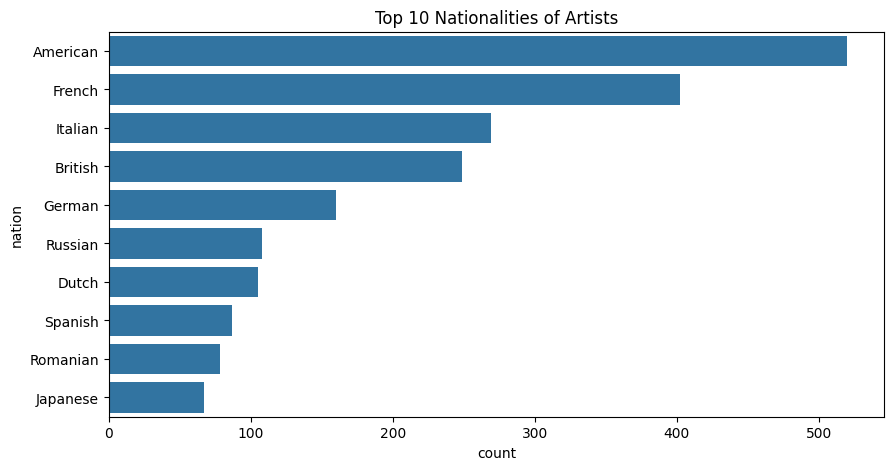

In [ ]:
plt.figure(figsize=(10, 5))
sns.countplot(y=artists['nation'], order=artists['nation'].value_counts().index[:10])
plt.title("Top 10 Nationalities of Artists")
plt.show()

As can be seen from following spread that in total works there are many outliers.

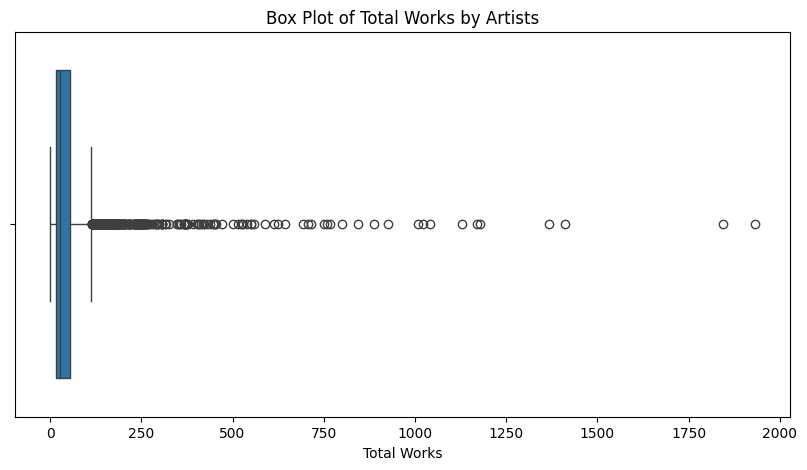

In [ ]:
artists['totalWorksNumeric'] = artists['totalWorksTitle'].str.extract('(\d+)').astype(float)

# Filter out any non-numeric or irrelevant values in the extracted data
artists_cleaned = artists.dropna(subset=['totalWorksNumeric'])

plt.figure(figsize=(10, 5))
sns.boxplot(data=artists_cleaned, x='totalWorksNumeric')
plt.title("Box Plot of Total Works by Artists")
plt.xlabel("Total Works")
plt.show()

##### For Relationships Dataset

In [ ]:
print("Dimensions of dataset: ", relationships.shape)
relationships.head()

Dimensions of dataset:  (2996, 8)


,artistUrl,friends,influenced_by,influenced_on,institution,movements,school,type
0,/en/apelles,NaN,/en/ancient-greek-painting,/en/ancient-greek-painting,NaN,"Classical Period (480 - 323 BC),Hellenistic Pe...",/en/artists-by-painting-school/heptanese-ionia...,Artists
1,/en/wang-wei,NaN,NaN,NaN,NaN,Tang Dynasty (618–907),NaN,Artists
2,/en/ancient-egyptian-painting,NaN,NaN,"/en/fayum-portrait,/en/ancient-greek-painting,...",NaN,"Early Dynastic Period (3150 – 2686 BC),Old Kin...",NaN,Collections
3,/en/guanxiu,NaN,NaN,NaN,NaN,"Tang Dynasty (618–907),Five Dynasties and Ten ...",NaN,Artists
4,/en/han-gan,NaN,NaN,NaN,NaN,Tang Dynasty (618–907),NaN,Artists


In [ ]:
relationships.describe()

,artistUrl,friends,influenced_by,influenced_on,institution,movements,school,type
count,2996,416,484,359,634,2956,1030,2995
unique,2996,350,407,317,208,717,381,2
top,/en/apelles,/en/jackson-pollock,/en/caravaggio,/en/david-bowie,/en/artists-by-art-institution/cole-des-beaux-...,Romanticism,/en/artists-by-painting-school/cole-de-paris,Artists
freq,1,6,8,3,52,177,48,2988


In [ ]:
# will handle these missing values in analysis part.
missing_values = relationships.isnull().sum()
missing_values

,0
artistUrl,0
friends,2580
influenced_by,2512
influenced_on,2637
institution,2362
movements,40
school,1966
type,1


To view the spread of movements

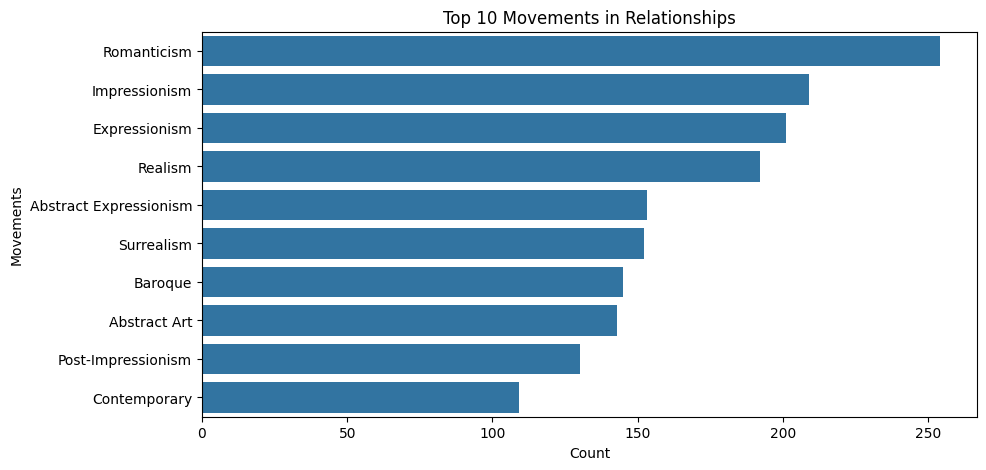

In [ ]:
# Movement distribution in relationships
movements_series = relationships['movements'].dropna().str.split(',').explode()
top_movements = movements_series.value_counts().nlargest(10)

plt.figure(figsize=(10, 5))
sns.barplot(y=top_movements.index, x=top_movements.values)
plt.title("Top 10 Movements in Relationships")
plt.xlabel("Count")
plt.ylabel("Movements")
plt.show()

##### For Institutions Dataset

In [ ]:
print("Dimensions of dataset: ", institutions.shape)
institutions.head()

Dimensions of dataset:  (73, 4)


,city,country,title,url
0,NaN,NaN,Guild of Saint Luke,/en/artists-by-art-institution/guild-of-saint-...
1,Antwerp,Belgium,Royal Academy of Fine Arts,/en/artists-by-art-institution/royal-academy-o...
2,Munich,Germany,Akademie der Bildenden Künste München (Munich ...,/en/artists-by-art-institution/akademie-der
3,Milan,Italy,Accademia di Belle Arti di Brera (Brera Academy),/en/artists-by-art-institution/accademia-di-be...
4,Paris,France,Académie des Beaux-Arts,/en/artists-by-art-institution/acad-mie-des-beaux


In [ ]:
institutions.describe()

,city,country,title,url
count,71,71,73,73
unique,52,35,73,73
top,Paris,UK,Guild of Saint Luke,/en/artists-by-art-institution/guild-of-saint-...
freq,7,8,1,1


In [ ]:
missing_values = institutions.isnull().sum()
missing_values

,0
city,2
country,2
title,0
url,0


To view the distribution of countries.

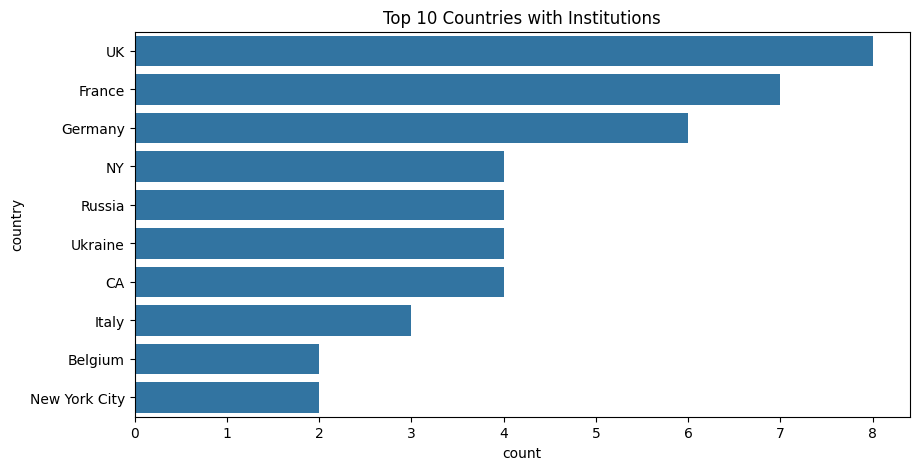

In [ ]:
plt.figure(figsize=(10, 5))
sns.countplot(y=institutions['country'].dropna(), order=institutions['country'].value_counts().index[:10])
plt.title("Top 10 Countries with Institutions")
plt.show()

##### For Schools Dataset

In [ ]:
print("Dimensions of dataset: ", schools.shape)
schools.head()

Dimensions of dataset:  (220, 2)


,title,url
0,Flemish School,/en/artists-by-painting-school/flemish-school
1,Sienese School,/en/artists-by-painting-school/sienese-school
2,Umbrian school,/en/artists-by-painting-school/umbrian-school
3,Florentine School,/en/artists-by-painting-school/florentine-school
4,Parma school,/en/artists-by-painting-school/parma-school


In [ ]:
schools.describe()

,title,url
count,220,220
unique,220,220
top,Flemish School,/en/artists-by-painting-school/flemish-school
freq,1,1


In [ ]:
missing_values = schools.isnull().sum()
missing_values

,0
title,0
url,0


## Networkx Visualizations

In this section, I will create network from above stated datasets. The Approach I have followed is to create Nodes for Artists, Institutes, Schools, Movements and then add edges in between them. First I created network from 2% of whole dataset to check if its actually rightly plotted. Then I created for the whole dataset. Since the Info is too much to view so what I did is I created sub networks from main networks for example One for Only Artists and Movements etc to have better visualization of the network.

##### Whole Network Analysis

Network with 2% of data.

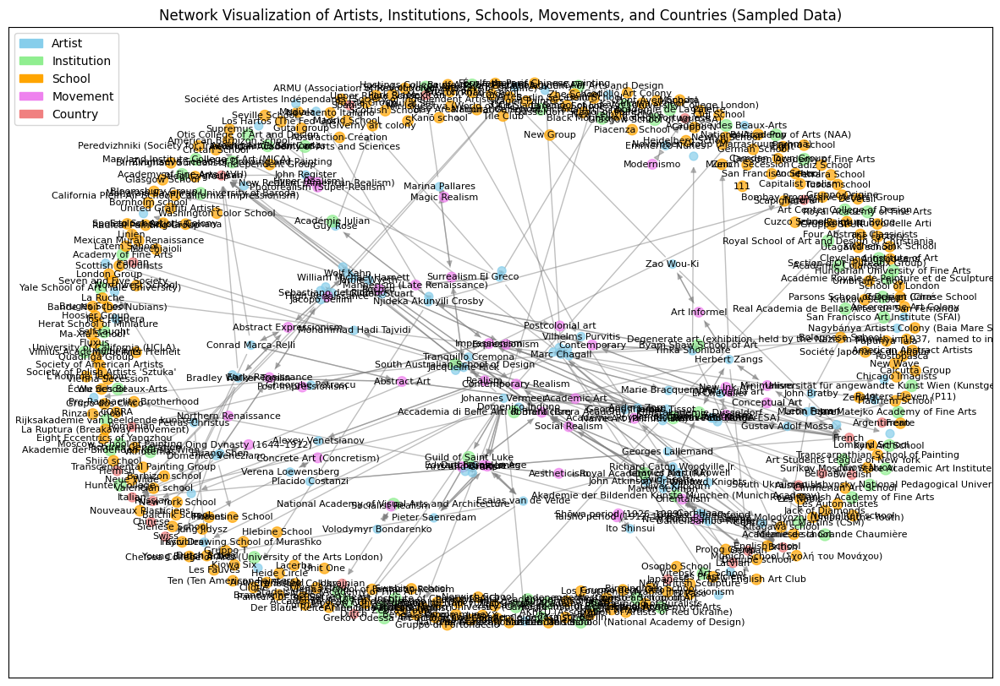

In [ ]:
# Sample 2% of the data
artists_sampled = artists.sample(frac=0.02, random_state=42)
institutions_sampled = institutions.sample(frac=1, random_state=42)
schools_sampled = schools.sample(frac=1, random_state=42)
relationships_sampled = relationships[relationships['artistUrl'].isin(artists_sampled['artistUrl'])]

# Initialize the directed graph
G = nx.DiGraph()

# Add artist nodes with 'title' as label
for _, row in artists_sampled.iterrows():
    title = row['title'] if pd.notna(row['title']) else row['artistUrl']
    G.add_node(row['artistUrl'], type='artist', label=title, nation=row['nation'], year=row['year'], totalWorks=row['totalWorksNumeric'])

# Add institution nodes
for _, row in institutions_sampled.iterrows():
    G.add_node(row['url'], type='institution', city=row['city'], country=row['country'], label=row['title'])

# Add school nodes
for _, row in schools_sampled.iterrows():
    G.add_node(row['url'], type='school', label=row['title'])

# Add movement nodes
for _, row in relationships_sampled.iterrows():
    if pd.notna(row['movements']):
        for movement in row['movements'].split(','):
            movement = movement.strip()
            if movement not in G:
                G.add_node(movement, type='movement', label=movement)

# Add edges based on sampled relationships
for _, row in relationships_sampled.iterrows():
    if pd.notna(row['influenced_by']):
        for influence in row['influenced_by'].split(','):
            G.add_edge(row['artistUrl'], influence.strip(), relationship='influenced_by')
    if pd.notna(row['friends']):
        for friend in row['friends'].split(','):
            G.add_edge(row['artistUrl'], friend.strip(), relationship='friend')
            G.add_edge(friend.strip(), row['artistUrl'], relationship='friend')
    if pd.notna(row['movements']):
        for movement in row['movements'].split(','):
            G.add_edge(row['artistUrl'], movement.strip(), relationship='movement')
            G.add_edge(movement.strip(), row['artistUrl'], relationship='movement')
    if pd.notna(row['school']):
        for school in row['school'].split(','):
            G.add_edge(row['artistUrl'], school.strip(), relationship='school')
    if pd.notna(row['institution']):
      institution_url = row['institution'].strip()
      if institution_url in institutions_sampled['url'].str.strip().str.lower().values:
          G.add_edge(row['artistUrl'], institution_url, relationship='institution')
          G.add_edge(institution_url, row['artistUrl'], relationship='institution')

# Add edges from artists to their countries
for _, row in artists_sampled.iterrows():
    country = row['nation']
    if pd.notna(country):
        G.add_node(country, type='country', label=country)
        G.add_edge(row['artistUrl'], country, relationship='from_country')


plt.figure(figsize=(15, 10))
pos = nx.spring_layout(G, seed=42)

node_colors = []
node_sizes = []

for node in G:
    node_type = G.nodes[node].get("type", "artist")
    if node_type == "artist":
        node_colors.append("skyblue")
        node_sizes.append(50)
    elif node_type == "institution":
        node_colors.append("lightgreen")
        node_sizes.append(100)
    elif node_type == "school":
        node_colors.append("orange")
        node_sizes.append(80)
    elif node_type == "movement":
        node_colors.append("violet")
        node_sizes.append(70)
    elif node_type == "country":
        node_colors.append("lightcoral")
        node_sizes.append(60)

nx.draw_networkx_nodes(G, pos, node_color=node_colors, node_size=node_sizes, alpha=0.7)
nx.draw_networkx_edges(G, pos, edge_color="gray", alpha=0.5)

labels = {node: data["label"] for node, data in G.nodes(data=True) if data.get("type") in ["institution", "school", "movement", "artist", "country"]}
nx.draw_networkx_labels(G, pos, labels=labels, font_size=8)

legend_elements = [
    mpatches.Patch(color='skyblue', label='Artist'),
    mpatches.Patch(color='lightgreen', label='Institution'),
    mpatches.Patch(color='orange', label='School'),
    mpatches.Patch(color='violet', label='Movement'),
    mpatches.Patch(color='lightcoral', label='Country')
]

plt.legend(handles=legend_elements, loc='upper left')

plt.title("Network Visualization of Artists, Institutions, Schools, Movements, and Countries (Sampled Data)")
plt.show()

Now the Network for Whole Dataset.

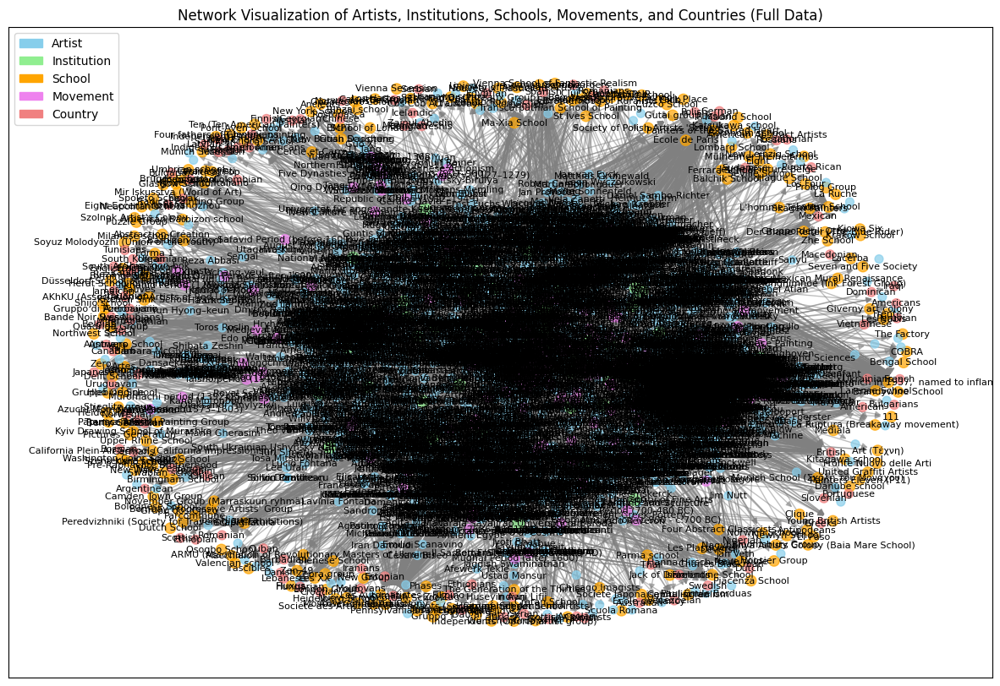

In [ ]:
G = nx.DiGraph()

# Add artist nodes with 'title' as label
for _, row in artists.iterrows():
    title = row['title'] if pd.notna(row['title']) else row['artistUrl']
    G.add_node(row['artistUrl'], type='artist', label=title, nation=row['nation'], year=row['year'], totalWorks=row['totalWorksNumeric'])

# Add institution nodes
for _, row in institutions.iterrows():
    G.add_node(row['url'], type='institution', city=row['city'], country=row['country'], label=row['title'])

# Add school nodes
for _, row in schools.iterrows():
    G.add_node(row['url'], type='school', label=row['title'])

# Add movement nodes
for _, row in relationships.iterrows():
    if pd.notna(row['movements']):
        for movement in row['movements'].split(','):
            movement = movement.strip()
            if movement not in G:
                G.add_node(movement, type='movement', label=movement)

# Add edges based on full relationships
for _, row in relationships.iterrows():
    if pd.notna(row['influenced_by']):
        for influence in row['influenced_by'].split(','):
            G.add_edge(row['artistUrl'], influence.strip(), relationship='influenced_by')
    if pd.notna(row['friends']):
        for friend in row['friends'].split(','):
            G.add_edge(row['artistUrl'], friend.strip(), relationship='friend')
            G.add_edge(friend.strip(), row['artistUrl'], relationship='friend')
    if pd.notna(row['movements']):
        for movement in row['movements'].split(','):
            G.add_edge(row['artistUrl'], movement.strip(), relationship='movement')
            G.add_edge(movement.strip(), row['artistUrl'], relationship='movement')
    if pd.notna(row['school']):
        for school in row['school'].split(','):
            G.add_edge(row['artistUrl'], school.strip(), relationship='school')
    if pd.notna(row['institution']):
        institution_url = row['institution'].strip()
        if institution_url in institutions_sampled['url'].str.strip().str.lower().values:
            G.add_edge(row['artistUrl'], institution_url, relationship='institution')
            G.add_edge(institution_url, row['artistUrl'], relationship='institution')


for _, row in artists.iterrows():
    country = row['nation']
    if pd.notna(country):
        G.add_node(country, type='country', label=country)
        G.add_edge(row['artistUrl'], country, relationship='from_country')

plt.figure(figsize=(15, 10))
pos = nx.spring_layout(G, seed=42)

node_colors = []
node_sizes = []

for node in G:
    node_type = G.nodes[node].get("type", "artist")
    if node_type == "artist":
        node_colors.append("skyblue")
        node_sizes.append(50)
    elif node_type == "institution":
        node_colors.append("lightgreen")
        node_sizes.append(100)
    elif node_type == "school":
        node_colors.append("orange")
        node_sizes.append(80)
    elif node_type == "movement":
        node_colors.append("violet")
        node_sizes.append(70)
    elif node_type == "country":
        node_colors.append("lightcoral")
        node_sizes.append(60)

nx.draw_networkx_nodes(G, pos, node_color=node_colors, node_size=node_sizes, alpha=0.7)
nx.draw_networkx_edges(G, pos, edge_color="gray", alpha=0.5)

labels = {node: data["label"] for node, data in G.nodes(data=True) if data.get("type") in ["institution", "school", "movement", "artist", "country"]}
nx.draw_networkx_labels(G, pos, labels=labels, font_size=8)

legend_elements = [
    mpatches.Patch(color='skyblue', label='Artist'),
    mpatches.Patch(color='lightgreen', label='Institution'),
    mpatches.Patch(color='orange', label='School'),
    mpatches.Patch(color='violet', label='Movement'),
    mpatches.Patch(color='lightcoral', label='Country')
]

plt.legend(handles=legend_elements, loc='upper left')

plt.title("Network Visualization of Artists, Institutions, Schools, Movements, and Countries (Full Data)")
plt.show()

##### Artist-School Analysis

So Now I will create a sub network from previous network to see relationships between schools. here again I have followed an approach to first show all relationships and then schools with more than 25 artists.

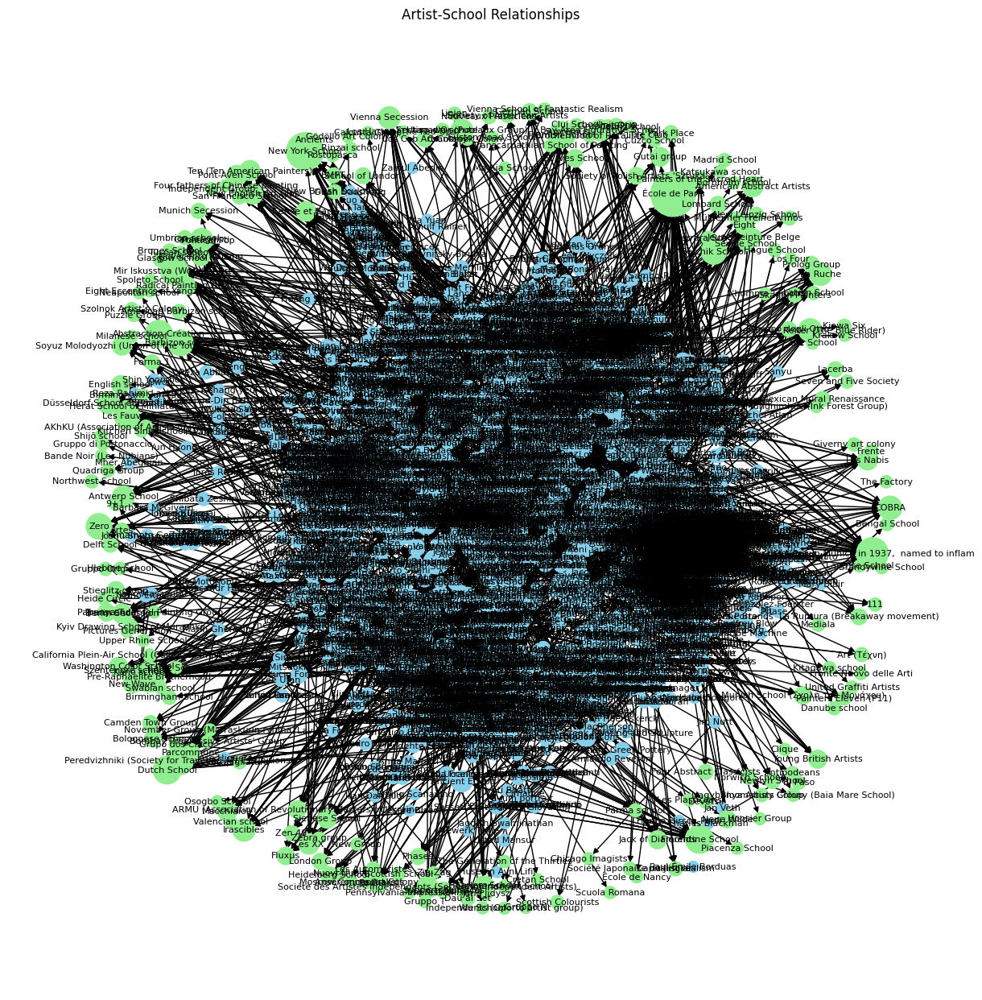

In [ ]:
# Filter nodes to include only artists and schools
filtered_nodes = [node for node in G if G.nodes[node].get("type") in ["artist", "school"]]

node_colors = ["skyblue" if G.nodes[node]["type"] == "artist" else "lightgreen" for node in filtered_nodes]
node_sizes = [100 + 20 * G.in_degree(node) for node in filtered_nodes]  # size based on in-degree

pos = nx.spring_layout(G, seed=42)

H = G.subgraph(filtered_nodes)

labels = nx.get_node_attributes(H, 'label')

plt.figure(figsize=(12, 12))
nx.draw(H, pos, with_labels=True, labels=labels, node_color=node_colors, node_size=node_sizes, font_size=8, font_color="black")
plt.title("Artist-School Relationships")
plt.show()

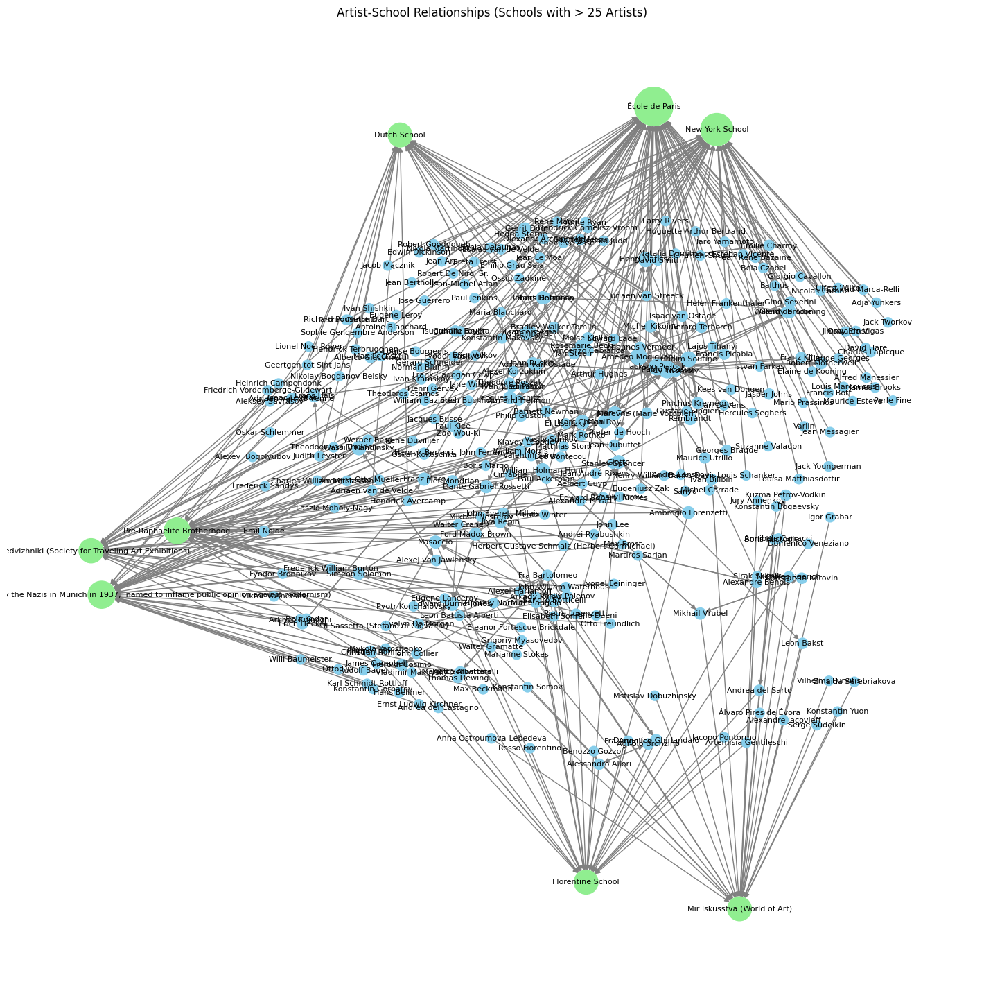

In [ ]:
# Identify school nodes with more than 25 incoming edges
target_schools = [
    node for node in G
    if "type" in G.nodes[node] and G.nodes[node]["type"] == "school" and G.in_degree(node) > 25
]

filtered_nodes = set(target_schools)
for school in target_schools:
    # Add all artist nodes that connect to this school
    filtered_nodes.update(G.predecessors(school))

subG = G.subgraph(filtered_nodes).copy()

node_colors = [
    "skyblue" if subG.nodes[node].get("type") == "artist" else "lightgreen"
    for node in subG
]
node_sizes = [100 + 20 * subG.in_degree(node) for node in subG]

pos = nx.spring_layout(subG, seed=42, k=0.38)
labels = nx.get_node_attributes(subG, 'label')

high_degree_schools = [node for node in target_schools if subG.in_degree(node) > 25]

# Adjust positions for high-degree school nodes (move slightly away from the main cluster to have better view)
for school in high_degree_schools:
    pos[school][0] *= 1.5
    pos[school][1] *= 1.5

plt.figure(figsize=(14, 14))
nx.draw(subG, pos, with_labels=True, labels=labels, node_color=node_colors, node_size=node_sizes, font_size=8, font_color="black", edge_color="grey")
plt.title("Artist-School Relationships (Schools with > 25 Artists)")
plt.show()

##### Artist-Movement Analysis

A sub network from original network to show relationship between artists and movement. First Graph is for all artists and movements and second is for movements with more than 200 artists.

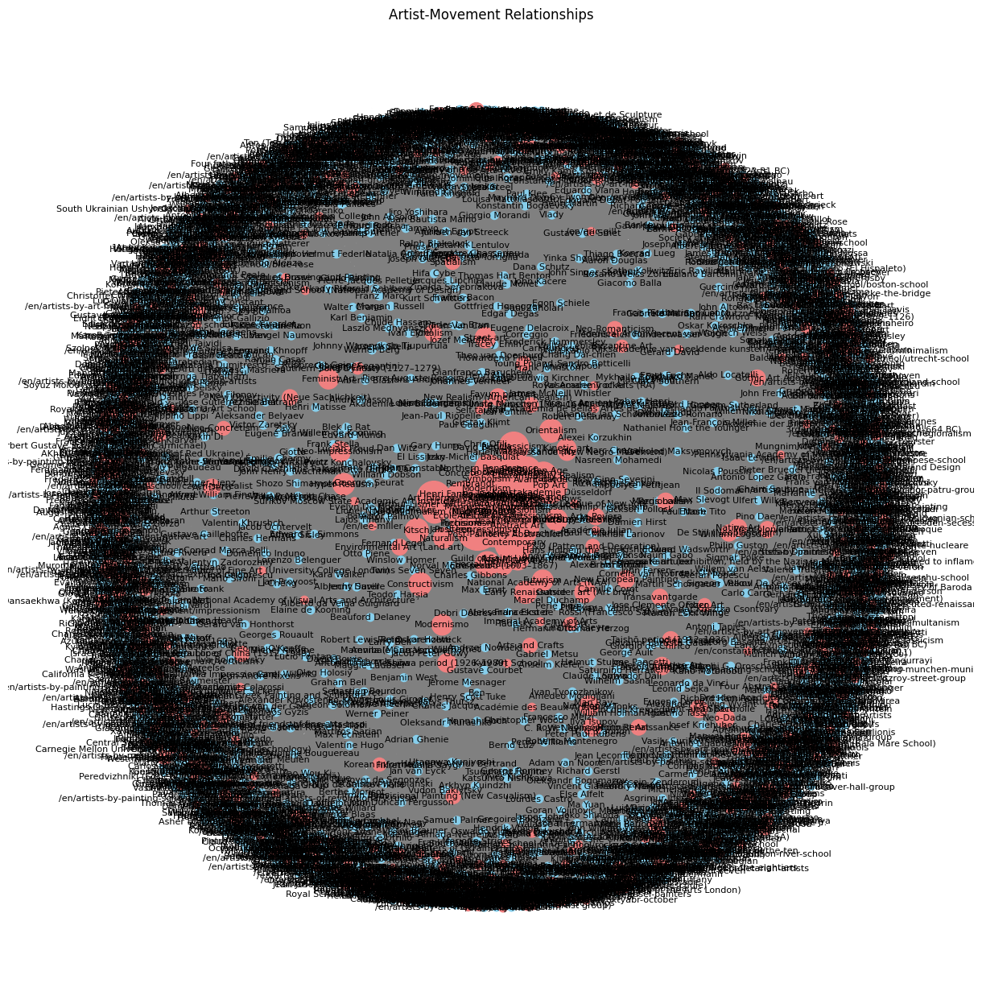

In [ ]:
G_artists_movements = G.copy()

# Filter for relationships where type == 'Artists' and movements are not missing
filtered_relationships = relationships[(relationships['type'] == 'Artists') & (relationships['movements'].notna())]

for _, row in filtered_relationships.iterrows():
    artist_url = row['artistUrl']
    for movement in row['movements'].split(','):
        movement = movement.strip()
        if movement not in G_artists_movements:
            G_artists_movements.add_node(movement, label=movement, type="movement")
        G_artists_movements.add_edge(artist_url, movement)

node_colors = [
    "skyblue" if G_artists_movements.nodes[node].get("type") == "artist" else "lightcoral"
    for node in G_artists_movements
]
node_sizes = [
    100 + 10 * G_artists_movements.in_degree(node) if G_artists_movements.nodes[node].get("type") == "movement" else 50
    for node in G_artists_movements
]

pos = nx.spring_layout(G_artists_movements, seed=42, k=0.5)
labels = {node: data.get("label", node) for node, data in G_artists_movements.nodes(data=True)}

plt.figure(figsize=(12, 12))
nx.draw(G_artists_movements, pos, with_labels=True, labels=labels, node_color=node_colors, node_size=node_sizes, font_size=8, font_color="black", edge_color="gray")
plt.title("Artist-Movement Relationships")
plt.show()

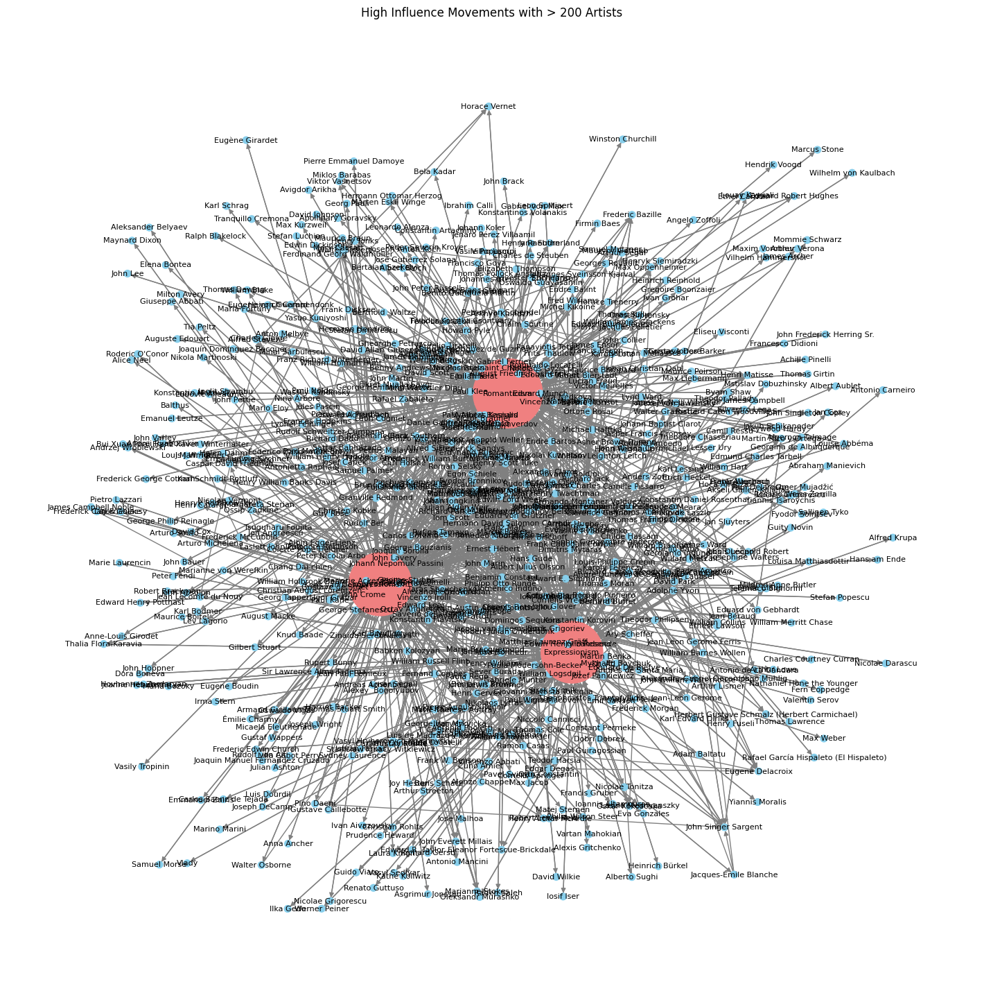

In [ ]:
G_high_influence = G_artists_movements.copy()

# Filter movements to only include those with more than 200 in-edges
high_influence_movements = [
    node for node, degree in G_high_influence.in_degree()
    if G_high_influence.nodes[node].get("type") == "movement" and degree > 200
]

filtered_nodes = set(high_influence_movements)
for movement in high_influence_movements:
    filtered_nodes.update(G_high_influence.predecessors(movement))

G_high_influence = G_high_influence.subgraph(filtered_nodes).copy()

node_colors_high_influence = [
    "skyblue" if G_high_influence.nodes[node].get("type") == "artist" else "lightcoral"
    for node in G_high_influence
]
node_sizes_high_influence = [
    100 + 20 * G_high_influence.in_degree(node) if G_high_influence.nodes[node].get("type") == "movement" else 50
    for node in G_high_influence
]

pos_high_influence = nx.spring_layout(G_high_influence, seed=42, k=0.8)
labels_high_influence = {node: data.get("label", node) for node, data in G_high_influence.nodes(data=True)}

# Add jitter to have better view.
jitter_strength = 1.05
for node in pos_high_influence:
    pos_high_influence[node][0] += np.random.uniform(-jitter_strength, jitter_strength)
    pos_high_influence[node][1] += np.random.uniform(-jitter_strength, jitter_strength)

plt.figure(figsize=(14, 14))
nx.draw(G_high_influence, pos_high_influence, with_labels=True, labels=labels_high_influence, node_color=node_colors_high_influence, node_size=node_sizes_high_influence, font_size=8, font_color="black", edge_color="gray")
plt.title("High Influence Movements with > 200 Artists")
plt.show()

##### Artist-InfluencedBy Analysis

Here I have created a new sub network to show relationship between artists who are inlfuenced by other artists. First Graph is for all artists and second is for artists with more than 6 out degree.

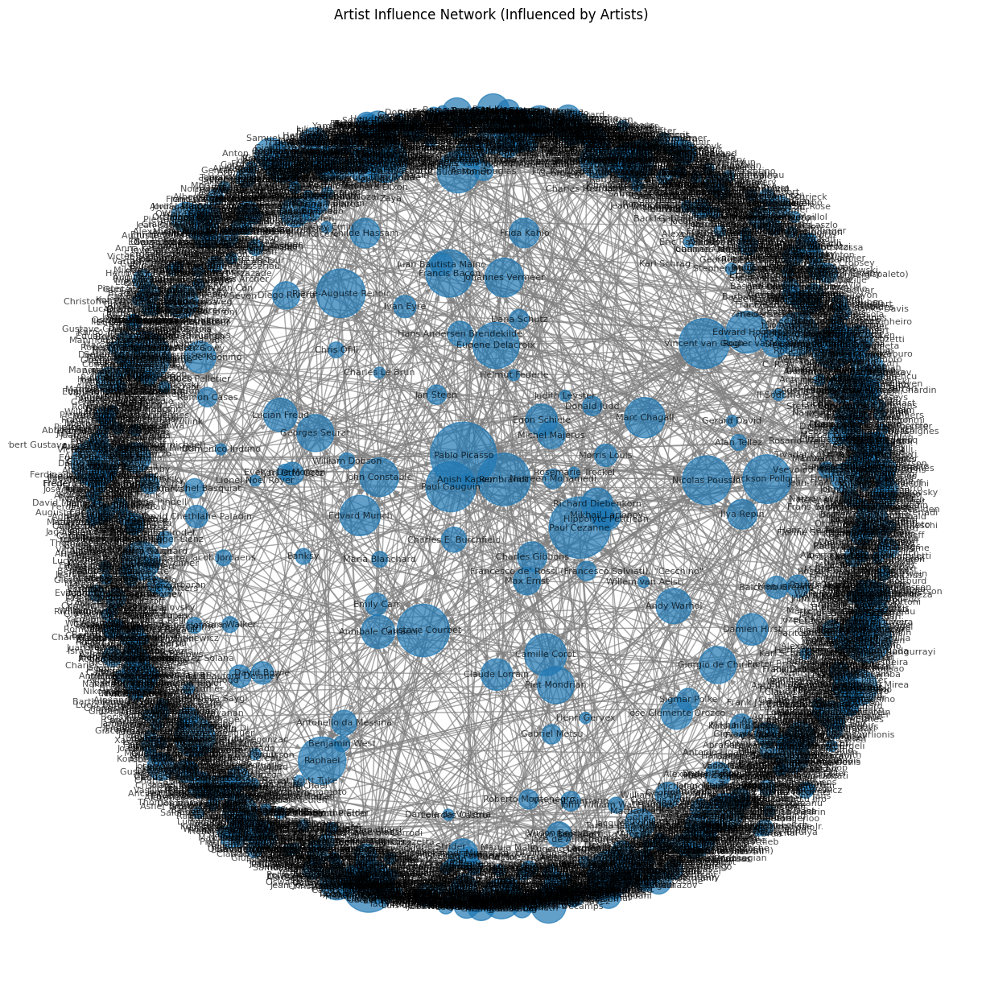

In [ ]:
# Filter relationships for artist influences
artist_relationships = relationships[relationships['type'] == 'Artists'].dropna(subset=['influenced_by', 'artistUrl'])

G_artist_influence = nx.DiGraph()

for _, row in artists.iterrows():
    G_artist_influence.add_node(row['artistUrl'], label=row['title'], name=row['title'])

for _, row in artist_relationships.iterrows():
    influencer = row['artistUrl']
    influences = row['influenced_by'].split(',')

    for influence in influences:
        influence = influence.strip()
        if influence in artists['artistUrl'].values:
            G_artist_influence.add_edge(influencer, influence)

node_sizes = [100 * (G_artist_influence.in_degree(node) + G_artist_influence.out_degree(node)) for node in G_artist_influence.nodes()]

plt.figure(figsize=(12, 12))
pos_artist_influence = nx.spring_layout(G_artist_influence, seed=42, k=0.5)  # Adjust k for spacing

labels = {row['artistUrl']: row['title'] for _, row in artists.iterrows()}

nx.draw(G_artist_influence, pos_artist_influence, with_labels=True, labels=labels, node_size=node_sizes, font_size=8, font_color="black", edge_color="gray", alpha=0.7)
plt.title("Artist Influence Network (Influenced by Artists)")
plt.show()

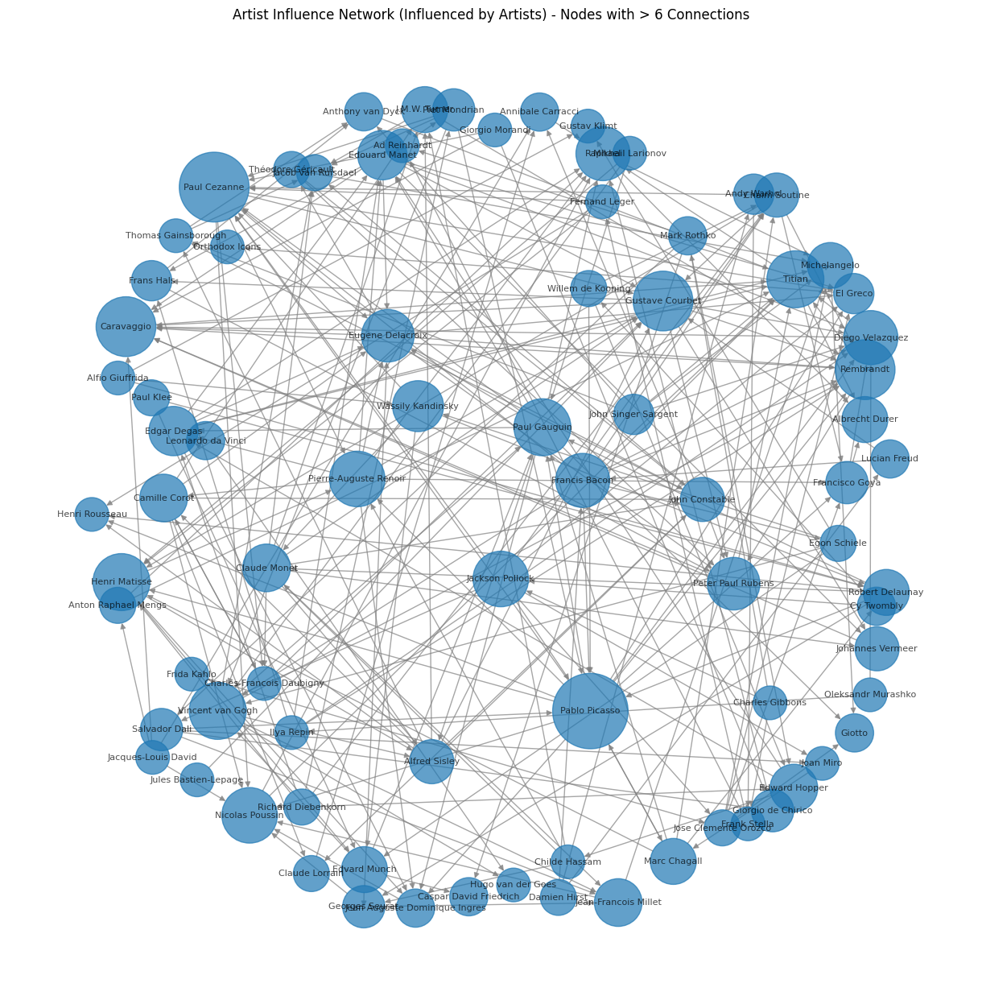

In [ ]:
artist_relationships = relationships[(relationships['type'] == 'Artists') & relationships['influenced_by'].notna()]

G_artist_influence = nx.DiGraph()

for _, row in artists.iterrows():
    G_artist_influence.add_node(row['artistUrl'], label=row['title'])

for _, row in artist_relationships.iterrows():
    influencer = row['artistUrl']
    influences = row['influenced_by'].split(',')

    for influence in influences:
        influence = influence.strip()
        if influence in artists['artistUrl'].values and influencer in artists['artistUrl'].values:
            G_artist_influence.add_edge(influencer, influence)

# Calculate node sizes based on in-degree and out-degree for artists only
node_sizes = {node: 130 * (G_artist_influence.in_degree(node) + G_artist_influence.out_degree(node)) for node in G_artist_influence.nodes()}

# Filter nodes to include only those with more than 6 in-degree and out-degree
filtered_nodes = [node for node in G_artist_influence.nodes() if (G_artist_influence.in_degree(node) + G_artist_influence.out_degree(node)) > 6]

G_filtered = G_artist_influence.subgraph(filtered_nodes)

plt.figure(figsize=(12, 12))
pos_artist_influence = nx.spring_layout(G_filtered, seed=42, k=1.5)  # Adjust k for spacing

labels = {row['artistUrl']: row['title'] for _, row in artists.iterrows()}
labels = {node: labels.get(node, node) for node in G_filtered.nodes()}

nx.draw(G_filtered, pos_artist_influence, with_labels=True, labels=labels, node_size=[node_sizes[node] for node in G_filtered.nodes()], font_size=8, font_color="black", edge_color="gray", alpha=0.7)
plt.title("Artist Influence Network (Influenced by Artists) - Nodes with > 6 Connections")
plt.show()

Just to have a glace at friends relationship, Plotted those artists who were firends with more than 2 artists. I have applied filter to show only nodes with greater than 2 degree thats why you may observe some edges are missing.

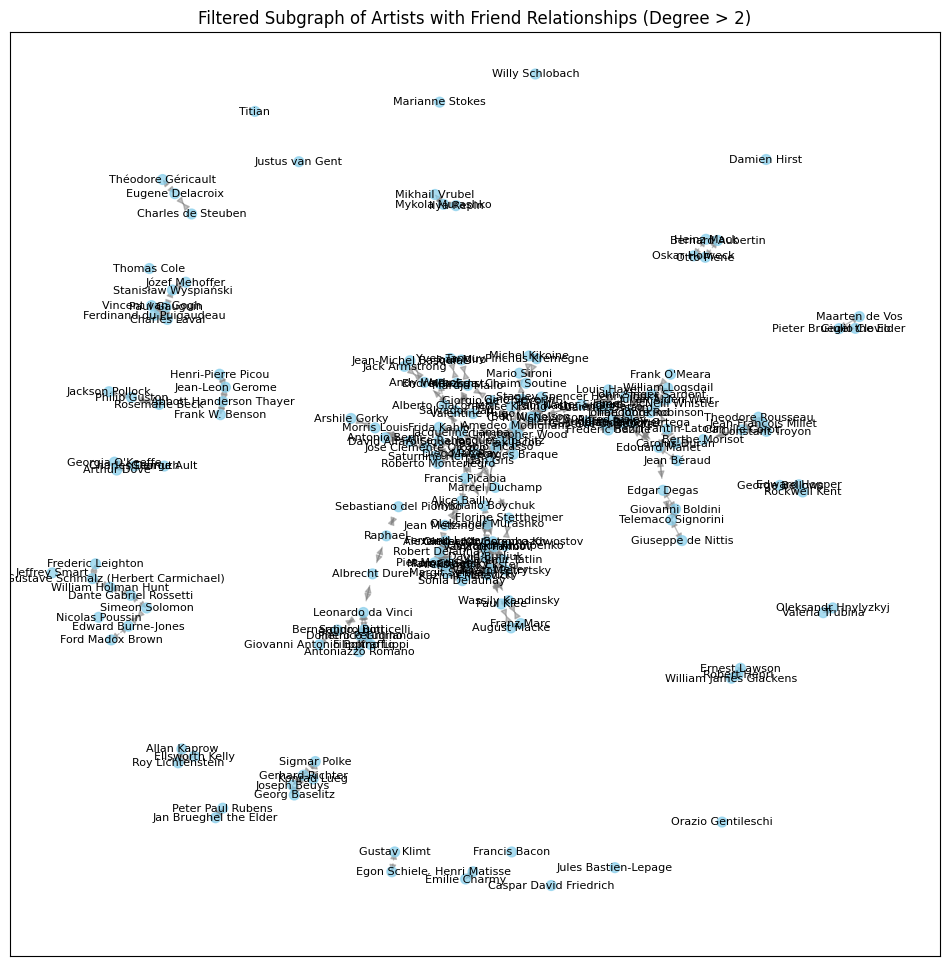

In [ ]:
G_friends_only = G.copy()

for node, attributes in list(G_friends_only.nodes(data=True)):
    if attributes.get('type') != 'artist':
        G_friends_only.remove_node(node)

for u, v, edge_data in list(G_friends_only.edges(data=True)):
    if edge_data.get('relationship') != 'friend':
        G_friends_only.remove_edge(u, v)

nodes_with_degree = [node for node in G_friends_only.nodes() if G_friends_only.degree(node) > 2]
G_friends_only = G_friends_only.subgraph(nodes_with_degree).copy()

plt.figure(figsize=(12, 12))
pos = nx.spring_layout(G_friends_only, seed=42)

node_colors = ["skyblue" for node in G_friends_only]
node_sizes = [50 for node in G_friends_only]

nx.draw_networkx_nodes(G_friends_only, pos, node_color=node_colors, node_size=node_sizes, alpha=0.7)
nx.draw_networkx_edges(G_friends_only, pos, edge_color="gray", alpha=0.5)

artist_labels = {node: data["label"] for node, data in G_friends_only.nodes(data=True)}
nx.draw_networkx_labels(G_friends_only, pos, labels=artist_labels, font_size=8)

plt.title("Filtered Subgraph of Artists with Friend Relationships (Degree > 2)")
plt.show()

## Bonus: Interactive Visualization.
So I have created a dataframe to make a single data source. Each Node will have all attributes like nation of artist, movement etc. I haven't added this in previous network to increase the visibility.

my approach uses ngrok to create a tunnel to view interactive tool. I have added ngrok token too. If it doesn't work while evaluation then let me know i will fix it. I have added a video too for the working of interactive tool in the mini project submission.

In [ ]:
!pip install dash dash-bootstrap-components pandas networkx plotly pyngrok

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 67.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 222.5/222.5 kB 19.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 228.0/228.0 kB 18.5 MB/s eta 0:00:00
  Attempting uninstall: Werkzeug
    Found existing installation: Werkzeug 3.1.3
    Uninstalling Werkzeug-3.1.3:
      Successfully uninstalled Werkzeug-3.1.3


In [ ]:
!ngrok authtoken 2o1hdmWTJuXRAKxy8TiFIUdIPhl_6G3irmkcWyxji3tVpWVwFs

Authtoken saved to configuration file: /root/.config/ngrok/ngrok.yml


In [ ]:
from pyngrok import ngrok

In [ ]:
# Step 1: Merge artists with relationships to get school and movement info
artist_relationship_data = pd.merge(
    artists,
    relationships[['artistUrl', 'school', 'movements']],
    on='artistUrl',
    how='left'
)

# Step 2: Merge with schools to get the school title
artist_enriched_data = pd.merge(
    artist_relationship_data,
    schools[['title', 'url']].rename(columns={'title': 'school_title', 'url': 'school_url'}),
    left_on='school',
    right_on='school_url',
    how='left'
)

# Drop any unnecessary columns and rename for clarity
artist_enriched_data = artist_enriched_data.drop(columns=['school', 'school_url'])
artist_enriched_data = artist_enriched_data.rename(columns={'school_title': 'school'})

# Fill any missing data with 'N/A' to handle cases where there might be no school or movement
artist_enriched_data[['school', 'movements', 'nation', 'totalWorksTitle', 'year']] = artist_enriched_data[['school', 'movements', 'nation', 'totalWorksTitle', 'year']].fillna('N/A')

# Now `artist_enriched_data` contains all the necessary information
artist_enriched_data.head()

,artistUrl,id,image,nation,title,totalWorksTitle,year,totalWorksNumeric,movements,school
0,/en/ancient-egyptian-painting,5d230b31edc2c9fb74ae130a,https://uploads2.wikiart.org/00244/images/anci...,Egyptians,Ancient Egypt,169 artworks,c.3150 BC - c.640 AD,169.0,"Early Dynastic Period (3150 – 2686 BC),Old Kin...",N/A
1,/en/ancient-greek-pottery,5ced09b1edc2c993247c1ea0,https://uploads7.wikiart.org/00238/images/anci...,Greeks,Ancient Greek Pottery,87 artworks,c.900 - 31 BC,87.0,"Geometric Period (c.900 - c.700 BC),Archaic Pe...",N/A
2,/en/ancient-greek-painting,5ce3c54dedc2c921c4035b7d,https://uploads8.wikiart.org/00237/images/anci...,Greeks,Ancient Greek Painting and Sculpture,76 artworks,c.700 - c.31 BC,76.0,"Archaic Period (700-480 BC),Classical Period (...",N/A
3,/en/apelles,5ba232ccedc2c918cc654ea8,https://uploads2.wikiart.org/00202/images/apel...,Greek,Apelles,8 artworks,born c.370 BC,8.0,"Classical Period (480 - 323 BC),Hellenistic Pe...",N/A
4,/en/fayum-portrait,5beea1ededc2c915a01acdda,https://uploads7.wikiart.org/00210/images//01....,Egyptians,Fayum portrait,76 artworks,c.50 - c.250,76.0,"Roman Period (30 BC - 640 AD),Coptic art",N/A


In [ ]:
import dash
from dash import dcc, html
from dash.dependencies import Input, Output
import plotly.graph_objects as go
import networkx as nx

# added because i was testing multiple times running this sell and it was creating one tunnel for each run. so just removing all tunnels before creating new one to avoid
# exceeding account limits.
!killall ngrok

# Initialize the Dash app
app = dash.Dash(__name__)

artist_network = nx.DiGraph()

for _, row in artist_enriched_data.iterrows():
    artist_network.add_node(row['artistUrl'], label=row['title'], nation=row['nation'], totalWorksTitle=row['totalWorksTitle'], year=row['year'], school=row['school'], movement=row['movements'])

for _, row in relationships.iterrows():
    if pd.notna(row['influenced_by']):
        for influencer in row['influenced_by'].split(','):
            if influencer in artist_network and row['artistUrl'] in artist_network:
                artist_network.add_edge(influencer, row['artistUrl'], label="influenced_by")

# Define layout
app.layout = html.Div([
    html.H1("Artist Influence Network"),
    dcc.Dropdown(
        id='artist-dropdown',
        options=[{'label': row['title'], 'value': row['artistUrl']} for _, row in artist_enriched_data.iterrows()],
        placeholder="Select an Artist",
        clearable=False
    ),
    dcc.Graph(id='network-graph'),
])

# Update graph based on selected artist
@app.callback(
    Output('network-graph', 'figure'),
    Input('artist-dropdown', 'value')
)
def update_graph(selected_artist):
    if not selected_artist:
        selected_artist = artist_enriched_data['artistUrl'].iloc[0]  # Default to first artist

    # Create subgraph for the selected artist and their influences
    subgraph_nodes = {selected_artist}
    subgraph_nodes.update(set(artist_network.predecessors(selected_artist)))  # Add influenced_by nodes

    subgraph = artist_network.subgraph(subgraph_nodes)

    pos = nx.spring_layout(subgraph)
    edge_x, edge_y, node_x, node_y, node_text, edge_text = [], [], [], [], [], []

    for edge in subgraph.edges(data=True):
        x0, y0 = pos[edge[0]]
        x1, y1 = pos[edge[1]]
        edge_x += [x0, x1, None]
        edge_y += [y0, y1, None]
        edge_text.append(edge[2].get("label", ""))

    for node in subgraph.nodes():
        x, y = pos[node]
        node_x.append(x)
        node_y.append(y)
        artist = artist_network.nodes[node]
        node_text.append(f"{artist['label']}<br>Nation: {artist['nation']}<br>School: {artist['school']}<br>Movement: {artist['movement']}<br>Total Works: {artist['totalWorksTitle']}<br>Year: {artist['year']}")

    edge_trace = go.Scatter(x=edge_x, y=edge_y, line=dict(width=0.5, color='#888'), hoverinfo='none', mode='lines')
    edge_label_trace = go.Scatter(x=edge_x[::3], y=edge_y[::3], text=edge_text, mode="text", hoverinfo="none", textposition="middle center", textfont=dict(color="red", size=10))  # Edge label in red

    node_trace = go.Scatter(x=node_x, y=node_y, mode='markers+text', text=node_text, hoverinfo='text')

    fig = go.Figure(data=[edge_trace, edge_label_trace, node_trace],
                    layout=go.Layout(
                        showlegend=False,
                        hovermode='closest',
                        margin=dict(b=0, l=0, r=0, t=0),
                        xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                        yaxis=dict(showgrid=False, zeroline=False, showticklabels=False)
                    ))

    return fig

if __name__ == '__main__':
    app.run_server(debug=True)

ngrok: no process found


<IPython.core.display.Javascript object>

##Network Analysis

Now I will do network analysis to answer the 5 goals of the mini project.

I am using same network G created for whole network visualization here so that i can cross verify my analysis graphically as well. and it worked well.
I am using 4 matrices: [degree, betweenness, pagerank, eigenvector] for analysis.

Below is the answer to following goals: (displaying only top 5 but the function is dynamic enough to display more)

1.   Which were the most influential artists?
2.   Which were the most influential institutions?
3.   Which were the most influential movements?


In [ ]:
degree_centrality = nx.degree_centrality(G)
betweenness_centrality = nx.betweenness_centrality(G)
pagerank = nx.pagerank(G)
eigenvector_centrality = nx.eigenvector_centrality(G)

# Create a dictionary to store the influence measures
influence_measures = {
    'artists': {},
    'institutions': {},
    'movements': {}
}

# Populate influence measures for artists, institutions, and movements
for node, attributes in G.nodes(data=True):
    label = attributes.get('label', node)  # Use the 'label' attribute, fallback to node if label is missing
    node_type = attributes.get('type')
    if node_type == 'artist':
        influence_measures['artists'][label] = {
            'degree': degree_centrality[node],
            'betweenness': betweenness_centrality[node],
            'pagerank': pagerank[node],
            'eigenvector': eigenvector_centrality[node],
        }
    elif node_type == 'institution':
        influence_measures['institutions'][label] = {
            'degree': degree_centrality[node],
            'betweenness': betweenness_centrality[node],
            'pagerank': pagerank[node],
            'eigenvector': eigenvector_centrality[node],
        }
    elif node_type == 'movement':
        influence_measures['movements'][label] = {
            'degree': degree_centrality[node],
            'betweenness': betweenness_centrality[node],
            'pagerank': pagerank[node],
            'eigenvector': eigenvector_centrality[node],
        }

# Function to get top N by measure
def get_top_n(influence_dict, n=5):
    top_n = {}
    for category, measures in influence_dict.items():
        top_n[category] = {
            'degree': sorted(measures.items(), key=lambda x: x[1]['degree'], reverse=True)[:n],
            'betweenness': sorted(measures.items(), key=lambda x: x[1]['betweenness'], reverse=True)[:n],
            'pagerank': sorted(measures.items(), key=lambda x: x[1]['pagerank'], reverse=True)[:n],
            'eigenvector': sorted(measures.items(), key=lambda x: x[1]['eigenvector'], reverse=True)[:n],
        }
    return top_n

# Get top 5 by each measure
top_influence_measures = get_top_n(influence_measures)

# Print the top influence measures
print("Top Influence Measures:")
for category, metrics in top_influence_measures.items():
    print(f"\n{category.capitalize()}:")
    for measure, items in metrics.items():
        print(f"\n  Top 5 by {measure.capitalize()}:")
        for label, values in items:
            print(f"    {label}: {values}")

Top Influence Measures:

Artists:

  Top 5 by Degree:
    Pablo Picasso: {'degree': 0.0186184565569347, 'betweenness': 0.03507315534301409, 'pagerank': 0.0010814797260087804, 'eigenvector': 0.012279692445719368}
    Amedeo Modigliani: {'degree': 0.0124123043712898, 'betweenness': 0.0059366393721830574, 'pagerank': 0.000775031315639201, 'eigenvector': 0.01225192028499032}
    Jackson Pollock: {'degree': 0.011872638963842417, 'betweenness': 0.007012218420697242, 'pagerank': 0.0005377315667307144, 'eigenvector': 0.0035649034411752555}
    Paul Gauguin: {'degree': 0.011332973556395036, 'betweenness': 0.006002180495879978, 'pagerank': 0.0007088446723008363, 'eigenvector': 0.0187087078250235}
    Pierre-Auguste Renoir: {'degree': 0.011063140852671344, 'betweenness': 0.005801081772865399, 'pagerank': 0.0006415766439164032, 'eigenvector': 0.04307355800901321}

  Top 5 by Betweenness:
    Pablo Picasso: {'degree': 0.0186184565569347, 'betweenness': 0.03507315534301409, 'pagerank': 0.00108147972

Below is answer for "Which nationalities concentrate the majority of artists?"

In [ ]:
artists_in_network = artists[artists['artistUrl'].isin(G.nodes())]
artists_filtered = artists_in_network[artists_in_network['nation'].notna() & (artists_in_network['nation'].str.lower() != 'none')]
nationality_counts = artists_filtered['nation'].value_counts()
top_nationalities = nationality_counts.head(10)

print("Top 10 Nationalities Concentrating the Majority of Artists Present in Network G:")
for nationality, count in top_nationalities.items():
    print(f"{nationality}: {count}")

Top 10 Nationalities Concentrating the Majority of Artists Present in Network G:
American: 520
French: 402
Italian: 269
British: 249
German: 160
Russian: 108
Dutch: 105
Spanish: 87
Romanian: 78
Japanese: 67


and in the end for "Which are the biggest communities in the network?".
In this task I have only considered the artists nodes which was present in complete network, cleaned data was entered in that network thats why I didn't perform data cleaning in the pre-processing step.

In [ ]:
artist_nodes = [node for node in G.nodes if G.nodes[node].get('type') == 'artist']
artist_subgraph = G.subgraph(artist_nodes)


Largest Communities (Top 5) by Node Count:
Community 1: 132 nodes
Community 2: 93 nodes
Community 3: 76 nodes
Community 4: 74 nodes
Community 5: 49 nodes


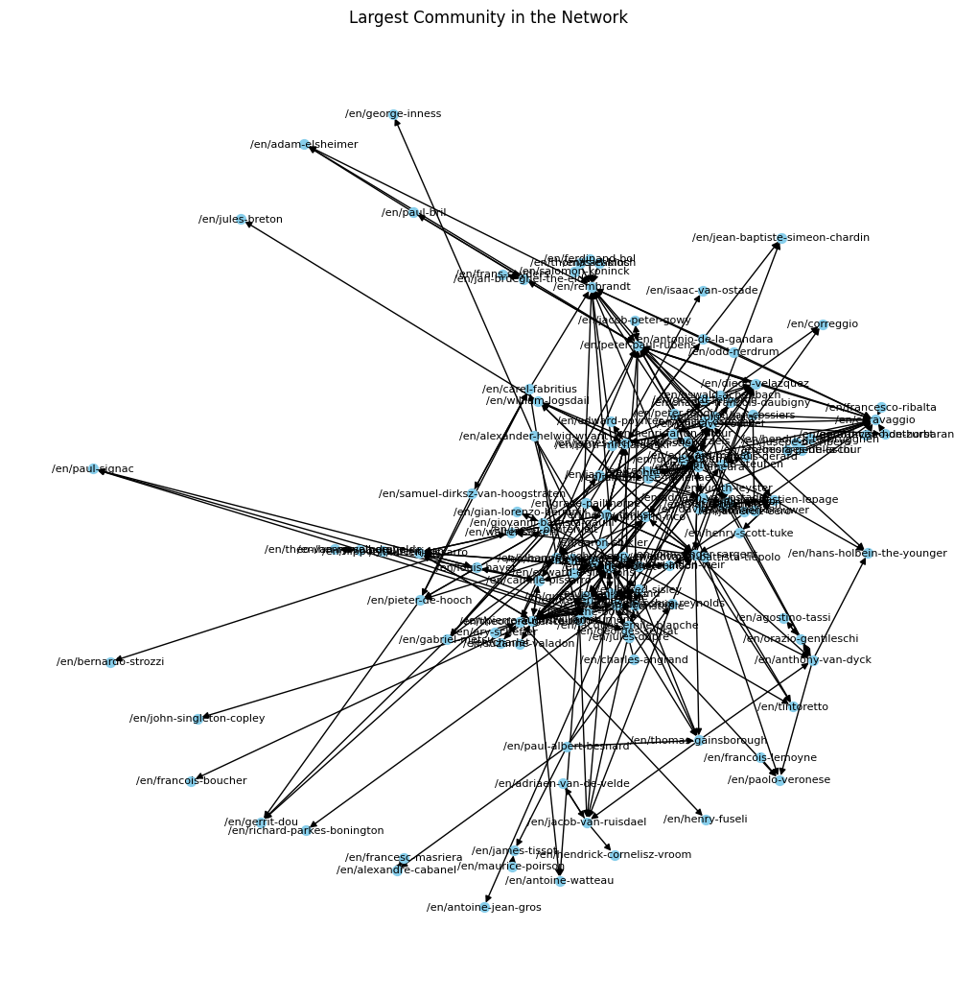

In [ ]:
communities = list(community.greedy_modularity_communities(artist_subgraph))
sorted_communities = sorted(communities, key=len, reverse=True)[:5]
print("\nLargest Communities (Top 5) by Node Count:")
for i, comm in enumerate(sorted_communities, 1):
    print(f"Community {i}: {len(comm)} nodes")

# Visualize the largest community with labels (optional)
largest_community = sorted_communities[0]  # Get nodes of the largest community
G_largest_community = G.subgraph(largest_community)
plt.figure(figsize=(10, 10))
pos = nx.spring_layout(G_largest_community, seed=42)
nx.draw(G_largest_community, pos, node_size=50, node_color="skyblue", with_labels=True, font_size=8)
plt.title("Largest Community in the Network")
plt.show()